<a href="https://colab.research.google.com/github/nomi181472/colab-nano-det-comparision/blob/main/nano_det_test_fps.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
!git clone https://github.com/RangiLyu/nanodet.git





fatal: destination path 'nanodet' already exists and is not an empty directory.
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
ERROR: Could not find a version that satisfies the requirement torch<2.0,>=1.10 (from versions: 2.5.0, 2.5.1, 2.6.0, 2.7.0, 2.7.1, 2.8.0, 2.9.0, 2.9.1, 2.10.0, 2.11.0, 2.12.0, 2.12.1, 2.13.0, 2.14.0)
ERROR: No matching distribution found for torch<2.0,>=1.10
Obtaining file:///content
ERROR: file:///content does not appear to be a Python project: neither 'setup.py' nor 'pyproject.toml' found.


In [9]:
!pip install -r ./nanodet/requirements.txt


  Using cached onnx-1.23.0-cp312-abi3-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (8.7 kB)
  Using cached onnx_simplifier-0.5.0.tar.gz (728 bytes)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached pyaml-26.7.0-py3-none-any.whl.metadata (12 kB)
  Using cached pytorch_lightning-1.9.5-py3-none-any.whl.metadata (23 kB)
ERROR: Could not find a version that satisfies the requirement torch<2.0,>=1.10 (from versions: 2.5.0, 2.5.1, 2.6.0, 2.7.0, 2.7.1, 2.8.0, 2.9.0, 2.9.1, 2.10.0, 2.11.0, 2.12.0, 2.12.1, 2.13.0, 2.14.0)
ERROR: No matching distribution found for torch<2.0,>=1.10


In [10]:
!pip install -e ./nanodet

Obtaining file:///content/nanodet
  Preparing metadata (setup.py) ... done
  Running setup.py develop for nanodet


In [14]:

!python ./nanodet/tools/export_onnx.py \
  --cfg_path ./nanodet/config/nanodet-plus-m_320.yml \
  --model_path ./nanodet-plus-m_320.pth

Traceback (most recent call last):
  File "/content/./nanodet/tools/export_onnx.py", line 18, in <module>
    import onnx
ModuleNotFoundError: No module named 'onnx'


In [15]:
!wget -q --show-progress \
  https://github.com/RangiLyu/nanodet/releases/download/v1.0.0-alpha-1/nanodet-plus-m_320.onnx

!wget -q -O nanodet-plus-m_320.yml \
  https://raw.githubusercontent.com/RangiLyu/nanodet/main/config/nanodet-plus-m_320.yml

nanodet-plus-m_320. 100%[===================>]   4.57M  --.-KB/s    in 0.02s   


In [18]:
!pip -q install onnxruntime opencv-python-headless pyyaml pandas tqdm requests

from pathlib import Path
import requests
import yaml

MODEL_DIR = Path("models")
MODEL_DIR.mkdir(exist_ok=True)

MODELS = {
    "plus-m-320": ("nanodet-plus-m_320.onnx", 320),
    "plus-m-416": ("nanodet-plus-m_416.onnx", 416),
    "plus-m-1.5x-320": ("nanodet-plus-m-1.5x_320.onnx", 320),
    "plus-m-1.5x-416": ("nanodet-plus-m-1.5x_416.onnx", 416),
}

RELEASE_BASE = (
    "https://github.com/RangiLyu/nanodet/releases/"
    "download/v1.0.0-alpha-1"
)

def download_file(url, destination):
    destination = Path(destination)

    if destination.exists() and destination.stat().st_size > 0:
        print(f"Already downloaded: {destination}")
        return

    with requests.get(url, stream=True, timeout=120) as response:
        response.raise_for_status()
        with open(destination, "wb") as output:
            for chunk in response.iter_content(chunk_size=1024 * 1024):
                if chunk:
                    output.write(chunk)

    print(
        f"Downloaded: {destination} "
        f"({destination.stat().st_size / 1_000_000:.1f} MB)"
    )

for model_name, (filename, size) in MODELS.items():
    download_file(
        f"{RELEASE_BASE}/{filename}",
        MODEL_DIR / filename,
    )

download_file(
    "https://raw.githubusercontent.com/RangiLyu/nanodet/"
    "main/config/nanodet-plus-m_320.yml",
    "nanodet-plus-m_320.yml",
)

with open("nanodet-plus-m_320.yml", encoding="utf-8") as f:
    config = yaml.safe_load(f)

labels = config["class_names"]
assert len(labels) == 80, f"Expected 80 classes, got {len(labels)}"

Path("labels.txt").write_text(
    "\n".join(labels) + "\n",
    encoding="utf-8",
)

print("Class IDs:", {
    name: labels.index(name)
    for name in ("person", "car", "motorcycle")
})

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.6/23.6 MB 64.3 MB/s eta 0:00:00
Downloaded: models/nanodet-plus-m_320.onnx (4.8 MB)
Downloaded: models/nanodet-plus-m_416.onnx (4.8 MB)
Downloaded: models/nanodet-plus-m-1.5x_320.onnx (9.9 MB)
Downloaded: models/nanodet-plus-m-1.5x_416.onnx (9.9 MB)
Already downloaded: nanodet-plus-m_320.yml
Class IDs: {'person': 0, 'car': 2, 'motorcycle': 3}


In [19]:
# Replace this with a direct HTTPS video URL.
# Signed object-storage URLs with query parameters are also fine.
VIDEO_URL = "https://cdn.pixabay.com/video/2016/11/15/6387-191695740_tiny.mp4"

video_path = Path("sample_video.mp4")
download_file(VIDEO_URL, video_path)

import cv2

capture = cv2.VideoCapture(str(video_path))
if not capture.isOpened():
    raise RuntimeError(
        "OpenCV could not read the downloaded video. "
        "Check that VIDEO_URL returns an actual video file."
    )

print("Width:", int(capture.get(cv2.CAP_PROP_FRAME_WIDTH)))
print("Height:", int(capture.get(cv2.CAP_PROP_FRAME_HEIGHT)))
print("Source FPS:", capture.get(cv2.CAP_PROP_FPS))
print("Frames:", int(capture.get(cv2.CAP_PROP_FRAME_COUNT)))
capture.release()

Downloaded: sample_video.mp4 (0.8 MB)
Width: 640
Height: 360
Source FPS: 25.0
Frames: 341


In [20]:
import time
import numpy as np
import onnxruntime as ort
import pandas as pd
from tqdm.auto import tqdm

# Detect only these classes. Set to None to show all 80 COCO classes.
TARGET_CLASSES = {"person", "car", "motorcycle"}

SCORE_THRESHOLD = 0.35
NMS_THRESHOLD = 0.60

# Use 300 for a quick test. Use None to process the full video.
MAX_FRAMES = 300

REG_MAX = 7
STRIDES = (8, 16, 32, 64)

# NanoDet config uses BGR mean/std.
MEAN = np.array([103.53, 116.28, 123.675], dtype=np.float32)
STD = np.array([57.375, 57.12, 58.395], dtype=np.float32)

OUTPUT_DIR = Path("outputs")
OUTPUT_DIR.mkdir(exist_ok=True)

def make_grid(input_size):
    centers = []
    strides = []

    for stride in STRIDES:
        grid_height = int(np.ceil(input_size / stride))
        grid_width = int(np.ceil(input_size / stride))

        for y in range(grid_height):
            for x in range(grid_width):
                # NanoDet uses x*stride, y*stride as grid centers.
                centers.append((x * stride, y * stride))
                strides.append(stride)

    return (
        np.asarray(centers, dtype=np.float32),
        np.asarray(strides, dtype=np.float32),
    )

def preprocess(frame, input_size):
    resized = cv2.resize(frame, (input_size, input_size))
    normalized = (resized.astype(np.float32) - MEAN) / STD

    return np.ascontiguousarray(
        normalized.transpose(2, 0, 1)[None, :, :, :]
    )

def decode_output(
    raw_output,
    frame_width,
    frame_height,
    input_size,
    centers,
    strides,
):
    predictions = np.squeeze(np.asarray(raw_output), axis=0)

    expected_channels = len(labels) + 4 * (REG_MAX + 1)

    if (
        predictions.ndim != 2
        or predictions.shape[1] != expected_channels
        or predictions.shape[0] != len(centers)
    ):
        raise ValueError(
            f"Unexpected ONNX output shape {predictions.shape}; "
            f"expected ({len(centers)}, {expected_channels})"
        )

    # Released NanoDet-Plus ONNX output already contains sigmoid class scores.
    class_scores = predictions[:, :len(labels)]
    class_ids = np.argmax(class_scores, axis=1)
    scores = class_scores[np.arange(len(predictions)), class_ids]

    if TARGET_CLASSES is None:
        target_ids = set(range(len(labels)))
    else:
        target_ids = {labels.index(name) for name in TARGET_CLASSES}

    keep = (
        (scores >= SCORE_THRESHOLD)
        & np.isin(class_ids, list(target_ids))
    )

    if not np.any(keep):
        return []

    selected_predictions = predictions[keep]
    selected_centers = centers[keep]
    selected_strides = strides[keep]
    selected_classes = class_ids[keep]
    selected_scores = scores[keep]

    # Distribution Focal Loss: 4 sides × 8 bins (reg_max=7).
    distributions = selected_predictions[:, len(labels):].reshape(
        -1, 4, REG_MAX + 1
    )

    distributions = (
        distributions
        - distributions.max(axis=2, keepdims=True)
    )
    probabilities = np.exp(distributions)
    probabilities /= probabilities.sum(axis=2, keepdims=True)

    bins = np.arange(REG_MAX + 1, dtype=np.float32)
    distances = (probabilities * bins).sum(axis=2)
    distances *= selected_strides[:, None]

    x1 = selected_centers[:, 0] - distances[:, 0]
    y1 = selected_centers[:, 1] - distances[:, 1]
    x2 = selected_centers[:, 0] + distances[:, 2]
    y2 = selected_centers[:, 1] + distances[:, 3]

    # Map coordinates from model input back to original video dimensions.
    x1 = np.clip(x1 * frame_width / input_size, 0, frame_width - 1)
    y1 = np.clip(y1 * frame_height / input_size, 0, frame_height - 1)
    x2 = np.clip(x2 * frame_width / input_size, 0, frame_width - 1)
    y2 = np.clip(y2 * frame_height / input_size, 0, frame_height - 1)

    boxes = []
    box_scores = []
    box_classes = []

    for i in range(len(selected_predictions)):
        box = [
            int(x1[i]),
            int(y1[i]),
            int(x2[i] - x1[i]),
            int(y2[i] - y1[i]),
        ]

        if box[2] <= 0 or box[3] <= 0:
            continue

        boxes.append(box)
        box_scores.append(float(selected_scores[i]))
        box_classes.append(int(selected_classes[i]))

    detections = []

    # Run NMS separately for each class.
    for class_id in set(box_classes):
        indices = [
            i for i, value in enumerate(box_classes)
            if value == class_id
        ]

        selected = cv2.dnn.NMSBoxes(
            [boxes[i] for i in indices],
            [box_scores[i] for i in indices],
            SCORE_THRESHOLD,
            NMS_THRESHOLD,
        )

        for local_index in np.asarray(selected).reshape(-1):
            i = indices[int(local_index)]
            detections.append(
                (boxes[i], box_scores[i], box_classes[i])
            )

    return detections

def annotate_frame(frame, detections, model_name):
    result = frame.copy()

    for (x, y, width, height), score, class_id in detections:
        cv2.rectangle(
            result,
            (x, y),
            (x + width, y + height),
            (0, 255, 0),
            2,
        )

        cv2.putText(
            result,
            f"{labels[class_id]} {score:.2f}",
            (x, max(24, y - 7)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.65,
            (0, 255, 0),
            2,
        )

    cv2.putText(
        result,
        model_name,
        (12, 32),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.85,
        (255, 255, 0),
        2,
    )

    return result

def process_video(model_name, model_filename, input_size, source_path):
    session = ort.InferenceSession(
        str(MODEL_DIR / model_filename),
        providers=["CPUExecutionProvider"],
    )

    input_name = session.get_inputs()[0].name
    centers, strides = make_grid(input_size)

    capture = cv2.VideoCapture(str(source_path))
    if not capture.isOpened():
        raise RuntimeError(f"Cannot open video: {source_path}")

    frame_width = int(capture.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
    source_fps = float(capture.get(cv2.CAP_PROP_FPS))
    total_source_frames = int(capture.get(cv2.CAP_PROP_FRAME_COUNT))

    if source_fps <= 0:
        source_fps = 30.0

    raw_output_path = OUTPUT_DIR / f"{model_name}_raw.mp4"
    playable_output_path = OUTPUT_DIR / f"{model_name}_annotated.mp4"

    writer = cv2.VideoWriter(
        str(raw_output_path),
        cv2.VideoWriter_fourcc(*"mp4v"),
        source_fps,
        (frame_width, frame_height),
    )

    if not writer.isOpened():
        capture.release()
        raise RuntimeError(f"Could not create {raw_output_path}")

    progress_total = (
        min(total_source_frames, MAX_FRAMES)
        if MAX_FRAMES is not None and total_source_frames > 0
        else total_source_frames if total_source_frames > 0
        else None
    )

    processed_frames = 0
    detection_count = 0
    inference_seconds = 0.0
    start_total = time.perf_counter()

    progress = tqdm(total=progress_total, desc=model_name)

    try:
        while MAX_FRAMES is None or processed_frames < MAX_FRAMES:
            ok, frame = capture.read()
            if not ok:
                break

            input_tensor = preprocess(frame, input_size)

            inference_start = time.perf_counter()
            outputs = session.run(
                None,
                {input_name: input_tensor},
            )
            inference_seconds += time.perf_counter() - inference_start

            if len(outputs) != 1:
                raise ValueError(
                    f"{model_name}: expected one ONNX output, "
                    f"received {len(outputs)}"
                )

            detections = decode_output(
                outputs[0],
                frame_width,
                frame_height,
                input_size,
                centers,
                strides,
            )

            annotated = annotate_frame(
                frame,
                detections,
                model_name,
            )
            writer.write(annotated)

            processed_frames += 1
            detection_count += len(detections)
            progress.update(1)

    finally:
        progress.close()
        capture.release()
        writer.release()

    processing_seconds = time.perf_counter() - start_total

    if processed_frames == 0:
        raise RuntimeError(f"No frames processed from {source_path}")

    # Convert OpenCV's MP4V output to H.264 for reliable Colab playback.
    import subprocess

    subprocess.run(
        [
            "ffmpeg",
            "-y",
            "-loglevel", "error",
            "-i", str(raw_output_path),
            "-c:v", "libx264",
            "-pix_fmt", "yuv420p",
            "-crf", "23",
            "-movflags", "+faststart",
            str(playable_output_path),
        ],
        check=True,
    )

    raw_output_path.unlink()

    return {
        "model": model_name,
        "frames": processed_frames,
        "source_fps": round(source_fps, 2),
        "inference_only_fps": round(
            processed_frames / inference_seconds, 2
        ),
        "processing_fps": round(
            processed_frames / processing_seconds, 2
        ),
        "detections": detection_count,
        "video": str(playable_output_path),
    }

In [21]:
results = []

for model_name, (filename, input_size) in MODELS.items():
    print(f"\nRunning {model_name}")
    result = process_video(
        model_name,
        filename,
        input_size,
        video_path,
    )
    results.append(result)

comparison = pd.DataFrame(results)
display(comparison)

comparison.to_csv(
    OUTPUT_DIR / "fps_comparison.csv",
    index=False,
)


Running plus-m-320


plus-m-320:   0%|          | 0/300 [00:00<?, ?it/s]


Running plus-m-416


plus-m-416:   0%|          | 0/300 [00:00<?, ?it/s]


Running plus-m-1.5x-320


plus-m-1.5x-320:   0%|          | 0/300 [00:00<?, ?it/s]


Running plus-m-1.5x-416


plus-m-1.5x-416:   0%|          | 0/300 [00:00<?, ?it/s]

,model,frames,source_fps,inference_only_fps,processing_fps,detections,video
0,plus-m-320,300,25.0,18.89,15.51,7342,outputs/plus-m-320_annotated.mp4
1,plus-m-416,300,25.0,12.02,10.20,9989,outputs/plus-m-416_annotated.mp4
2,plus-m-1.5x-320,300,25.0,12.16,10.69,6504,outputs/plus-m-1.5x-320_annotated.mp4
3,plus-m-1.5x-416,300,25.0,7.34,6.54,9292,outputs/plus-m-1.5x-416_annotated.mp4


In [23]:
from IPython.display import Video, display

CHOSEN_MODEL = "plus-m-1.5x-416"
# Other choices:
# "plus-m-416"
# "plus-m-1.5x-320"
# "plus-m-1.5x-416"

chosen_video = next(
    row["video"]
    for row in results
    if row["model"] == CHOSEN_MODEL
)

display(Video(chosen_video, embed=True, width=800))

,model,frames,source_fps,inference_only_fps,processing_fps,processing_ms_per_frame,real_time_ratio,keeps_up_with_source,detections,detections_per_frame
0,plus-m-320,300,25.0,18.89,15.51,64.5,0.62,No,7342,24.473
1,plus-m-1.5x-320,300,25.0,12.16,10.69,93.5,0.43,No,6504,21.680
2,plus-m-416,300,25.0,12.02,10.20,98.0,0.41,No,9989,33.297
3,plus-m-1.5x-416,300,25.0,7.34,6.54,152.9,0.26,No,9292,30.973


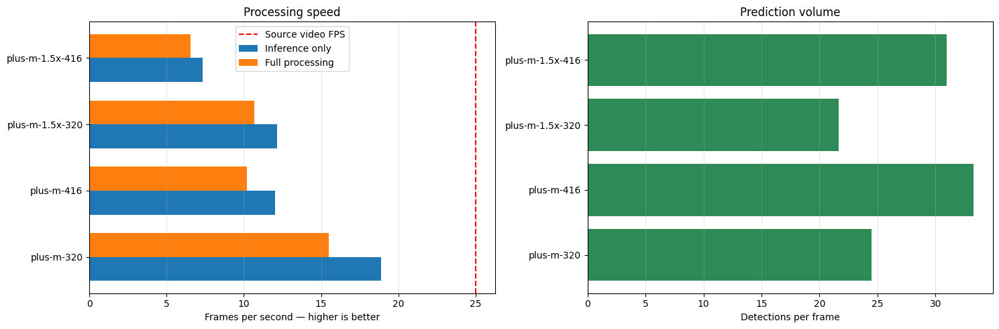

Fastest full processing: plus-m-320 (15.51 FPS)
Models keeping up with source FPS: []
Saved: outputs/model_analytics.png and outputs/model_analytics.csv


In [24]:
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display

analytics = pd.DataFrame(results).copy()

analytics["detections_per_frame"] = (
    analytics["detections"] / analytics["frames"]
).round(3)

analytics["processing_ms_per_frame"] = (
    1000 / analytics["processing_fps"]
).round(1)

analytics["inference_ms_per_frame"] = (
    1000 / analytics["inference_only_fps"]
).round(1)

analytics["real_time_ratio"] = (
    analytics["processing_fps"] / analytics["source_fps"]
).round(2)

analytics["keeps_up_with_source"] = np.where(
    analytics["processing_fps"] >= analytics["source_fps"],
    "Yes",
    "No",
)

columns = [
    "model",
    "frames",
    "source_fps",
    "inference_only_fps",
    "processing_fps",
    "processing_ms_per_frame",
    "real_time_ratio",
    "keeps_up_with_source",
    "detections",
    "detections_per_frame",
]

display(
    analytics[columns]
    .sort_values("processing_fps", ascending=False)
    .reset_index(drop=True)
)

names = analytics["model"].tolist()
positions = np.arange(len(names))

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Speed comparison
axes[0].barh(
    positions - 0.18,
    analytics["inference_only_fps"],
    height=0.36,
    label="Inference only",
)
axes[0].barh(
    positions + 0.18,
    analytics["processing_fps"],
    height=0.36,
    label="Full processing",
)
axes[0].axvline(
    analytics["source_fps"].iloc[0],
    color="red",
    linestyle="--",
    label="Source video FPS",
)
axes[0].set_yticks(positions, names)
axes[0].set_xlabel("Frames per second — higher is better")
axes[0].set_title("Processing speed")
axes[0].legend()
axes[0].grid(axis="x", alpha=0.3)

# Prediction volume comparison
axes[1].barh(
    names,
    analytics["detections_per_frame"],
    color="seagreen",
)
axes[1].set_xlabel("Detections per frame")
axes[1].set_title("Prediction volume")
axes[1].grid(axis="x", alpha=0.3)

plt.tight_layout()

chart_path = OUTPUT_DIR / "model_analytics.png"
plt.savefig(chart_path, dpi=160, bbox_inches="tight")
plt.show()

analytics_path = OUTPUT_DIR / "model_analytics.csv"
analytics[columns].to_csv(analytics_path, index=False)

fastest = analytics.loc[analytics["processing_fps"].idxmax()]
print(
    f"Fastest full processing: {fastest['model']} "
    f"({fastest['processing_fps']:.2f} FPS)"
)
print(
    "Models keeping up with source FPS:",
    analytics.loc[
        analytics["keeps_up_with_source"] == "Yes",
        "model",
    ].tolist(),
)
print(f"Saved: {chart_path} and {analytics_path}")

In [26]:
from IPython.display import HTML, display
from pathlib import Path
import base64
import html

cards = []

for row in results:
    video_b64 = base64.b64encode(
        Path(row["video"]).read_bytes()
    ).decode("ascii")

    cards.append(f"""
        <div>
            <h4>{html.escape(row["model"])}</h4>
            <video
                controls
                autoplay
                muted
                loop
                playsinline
                width="100%"
                preload="auto"
            >
                <source
                    src="data:video/mp4;base64,{video_b64}"
                    type="video/mp4"
                >
            </video>
            <p>
                Processing: {row["processing_fps"]} FPS ·
                Detections: {row["detections"]}
            </p>
        </div>
    """)

# Keep JavaScript outside the f-string.
sync_script = """
<script>
(() => {
    const container = document.getElementById("nanodet-video-grid");
    const videos = Array.from(container.querySelectorAll("video"));

    Promise.all(videos.map(video => new Promise(resolve => {
        if (video.readyState >= 2) {
            resolve();
        } else {
            video.addEventListener("loadeddata", resolve, {once: true});
        }
    }))).then(() => {
        videos.forEach(video => {
            video.pause();
            video.currentTime = 0;
        });
        videos.forEach(video => {
            video.play().catch(() => {});
        });
    });
})();
</script>
"""

grid_html = """
<div id="nanodet-video-grid" style="
    display: grid;
    grid-template-columns: repeat(2, minmax(0, 1fr));
    gap: 20px;
">
""" + "\n".join(cards) + "</div>" + sync_script

display(HTML(grid_html))

In [30]:
!pip -q install -U huggingface_hub

from huggingface_hub import notebook_login

notebook_login()

In [28]:
from pathlib import Path
import shutil

upload_dir = Path("nanodet_hf_upload")
upload_dir.mkdir(exist_ok=True)

for model_name, (filename, input_size) in MODELS.items():
    model_dir = upload_dir / model_name
    model_dir.mkdir(parents=True, exist_ok=True)

    shutil.copy2(MODEL_DIR / filename, model_dir / filename)
    shutil.copy2("labels.txt", model_dir / "labels.txt")

    print(model_dir / filename)
    print(model_dir / "labels.txt")

readme = """---
license: apache-2.0
pipeline_tag: object-detection
tags:
- nanodet
- nanodet-plus
- onnx
- coco
---

# NanoDet-Plus ONNX models

Four pretrained NanoDet-Plus COCO object detection models from the
[official NanoDet project](https://github.com/RangiLyu/nanodet).

| Folder | Input size |
| --- | --- |
| `plus-m-320/` | 320 × 320 |
| `plus-m-416/` | 416 × 416 |
| `plus-m-1.5x-320/` | 320 × 320 |
| `plus-m-1.5x-416/` | 416 × 416 |

Each folder contains an ONNX model and a matching `labels.txt`.
Labels are one per line, in zero-based COCO class order.
Examples: person = 0, car = 2, motorcycle = 3.

These are pretrained models published by the NanoDet authors.
This repository repackages the original ONNX files with their labels;
it does not claim to have trained or fine-tuned them.

## Source

- Project: https://github.com/RangiLyu/nanodet
- Original releases: https://github.com/RangiLyu/nanodet/releases
- License: https://github.com/RangiLyu/nanodet/blob/main/LICENSE

## Inference

The ONNX output contains class scores and box distributions. NanoDet-specific
box decoding and non-maximum suppression are required; the raw ONNX output
is not a final list of bounding boxes.
"""

(upload_dir / "README.md").write_text(readme, encoding="utf-8")

print("\nUpload folder ready:")
for path in sorted(upload_dir.rglob("*")):
    if path.is_file():
        print(path)

nanodet_hf_upload/plus-m-320/nanodet-plus-m_320.onnx
nanodet_hf_upload/plus-m-320/labels.txt
nanodet_hf_upload/plus-m-416/nanodet-plus-m_416.onnx
nanodet_hf_upload/plus-m-416/labels.txt
nanodet_hf_upload/plus-m-1.5x-320/nanodet-plus-m-1.5x_320.onnx
nanodet_hf_upload/plus-m-1.5x-320/labels.txt
nanodet_hf_upload/plus-m-1.5x-416/nanodet-plus-m-1.5x_416.onnx
nanodet_hf_upload/plus-m-1.5x-416/labels.txt

Upload folder ready:
nanodet_hf_upload/README.md
nanodet_hf_upload/plus-m-1.5x-320/labels.txt
nanodet_hf_upload/plus-m-1.5x-320/nanodet-plus-m-1.5x_320.onnx
nanodet_hf_upload/plus-m-1.5x-416/labels.txt
nanodet_hf_upload/plus-m-1.5x-416/nanodet-plus-m-1.5x_416.onnx
nanodet_hf_upload/plus-m-320/labels.txt
nanodet_hf_upload/plus-m-320/nanodet-plus-m_320.onnx
nanodet_hf_upload/plus-m-416/labels.txt
nanodet_hf_upload/plus-m-416/nanodet-plus-m_416.onnx


In [29]:
from huggingface_hub import HfApi

api = HfApi()
username = api.whoami()["name"]

REPO_NAME = "nanodet-plus-onnx"
REPO_ID = f"{username}/{REPO_NAME}"

# Set private=True if you only want your account to access the models.
api.create_repo(
    repo_id=REPO_ID,
    repo_type="model",
    private=False,
    exist_ok=True,
)

api.upload_folder(
    repo_id=REPO_ID,
    repo_type="model",
    folder_path=str(upload_dir),
    commit_message="Add four NanoDet-Plus ONNX models and COCO labels",
)

print(f"Uploaded: https://huggingface.co/{REPO_ID}")

Uploaded: https://huggingface.co/nouman/nanodet-plus-onnx


In [30]:
from pathlib import Path
import shutil
from huggingface_hub import HfApi

benchmark_dir = Path("hf_benchmark_upload")
benchmark_dir.mkdir(exist_ok=True)

# Original sample video
shutil.copy2(video_path, benchmark_dir / "sample_video.mp4")

# Four annotated videos
for row in results:
    source = Path(row["video"])
    shutil.copy2(source, benchmark_dir / source.name)

# FPS and analytics files
for filename in ("fps_comparison.csv", "model_analytics.csv", "model_analytics.png"):
    source = OUTPUT_DIR / filename
    if source.exists():
        shutil.copy2(source, benchmark_dir / filename)

notes = f"""# NanoDet-Plus video comparison

The same sample video was processed with all four ONNX models.

- Source video FPS: {results[0]['source_fps']}
- Frames processed per model: {results[0]['frames']}
- Score threshold: {SCORE_THRESHOLD}
- NMS threshold: {NMS_THRESHOLD}
- Classes displayed: {sorted(TARGET_CLASSES) if TARGET_CLASSES else 'all 80 COCO classes'}
- Runtime: Google Colab, ONNX Runtime CPUExecutionProvider

`inference_only_fps` measures ONNX execution.
`processing_fps` includes reading, preprocessing, inference,
postprocessing, drawing, and writing the video. It excludes the
final H.264 conversion.

Detection counts are predictions, not an accuracy metric.
The video needs ground-truth annotations to calculate precision,
recall, or mAP.
"""

(benchmark_dir / "README.md").write_text(notes, encoding="utf-8")

api = HfApi()

api.upload_folder(
    repo_id=REPO_ID,
    repo_type="model",
    folder_path=str(benchmark_dir),
    path_in_repo="benchmarks/sample-video-01",
    commit_message="Add sample video and four-model inference comparison",
)

print(
    f"https://huggingface.co/{REPO_ID}/tree/main/"
    "benchmarks/sample-video-01"
)

/usr/local/lib/python3.13/dist-packages/huggingface_hub/hf_api.py:11754: UserWarning: Warnings while validating metadata in README.md:
- empty or missing yaml metadata in repo card
  warnings.warn(f"Warnings while validating metadata in README.md:\n{message}")


https://huggingface.co/nouman/nanodet-plus-onnx/tree/main/benchmarks/sample-video-01
